# Financial Health Prediction and Feature Importance Analysis For Enterprises

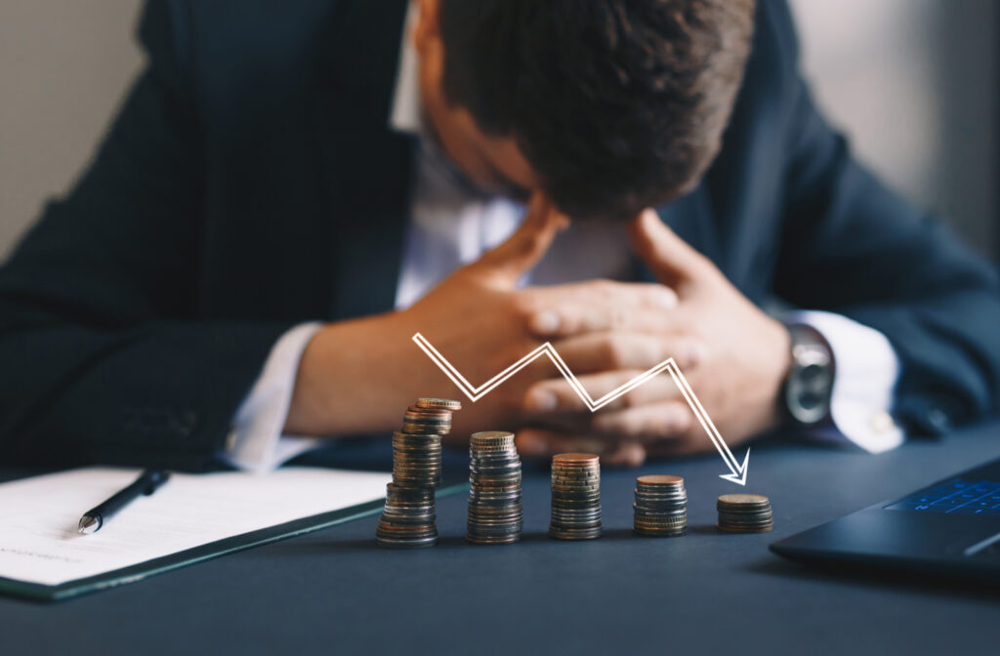

### Import Libraries

In [2]:
import pandas as pd
import numpy as np

import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns
from random import randint

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,classification_report, confusion_matrix, f1_score

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

import warnings
warnings.filterwarnings("ignore")

### Data Loading

In [4]:
df = pd.read_csv('C:/Users/niran/Desktop/Bankruptcy/Datathon dataset.csv')

### A glimpse into the original data

In [5]:
pd.set_option('display.max_columns',100)
df.head()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share (Yuan ¥),Per Share Net profit before tax (Yuan ¥),Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,0.780985,1.256969e-04,0.0,0.458143,0.000725,0.0,0.147950,0.147950,0.147950,0.169141,0.311664,0.017560,0.095921,0.138736,0.022102,0.848195,0.688979,0.688979,0.217535,4.980000e+09,0.000327,0.263100,0.363725,0.002259,0.001208,0.629951,0.021266,0.207576,0.792424,0.005024,0.390284,0.006479,0.095885,0.137757,0.398036,0.086957,0.001814,0.003487,1.820926e-04,1.165007e-04,0.032903,0.034164,0.392913,0.037135,0.672775,0.166673,0.190643,0.004094,0.001997,1.473360e-04,0.147308,0.334015,0.276920,0.001036,0.676269,0.721275,0.339077,0.025592,0.903225,0.002022,0.064856,7.010000e+08,6.550000e+09,0.593831,4.580000e+08,0.671568,0.424206,0.676269,0.339077,0.126549,0.637555,0.458609,0.520382,0.312905,0.118250,0,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,0.781506,2.897851e-04,0.0,0.461867,0.000647,0.0,0.182251,0.182251,0.182251,0.208944,0.318137,0.021144,0.093722,0.169918,0.022080,0.848088,0.689693,0.689702,0.217620,6.110000e+09,0.000443,0.264516,0.376709,0.006016,0.004039,0.635172,0.012502,0.171176,0.828824,0.005059,0.376760,0.005835,0.093743,0.168962,0.397725,0.064468,0.001286,0.004917,9.360000e+09,7.190000e+08,0.025484,0.0068

In [6]:
pd.set_option('display.max_columns',100)
df.tail()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share (Yuan ¥),Per Share Net profit before tax (Yuan ¥),Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
6814,0,0.493687,0.539468,0.543230,0.604455,0.604462,0.998992,0.797409,0.809331,0.303510,0.781588,1.510213e-04,4.500000e+09,0.463734,1.790179e-04,0.113372,0.175045,0.175045,0.175045,0.216602,0.320966,0.020766,0.098200,0.172102,0.022374,0.848205,0.689778,0.689778,0.217635,7.070000e+09,0.000450,0.264517,0.380155,0.010451,0.005457,0.631415,0.006655,0.124618,0.875382,0.005150,0.373823,0.005366,0.098222,0.171111,0.404804,0.103448,0.000690,0.009177,4.030000e+07,0.000143,0.027903,0.006348,0.392596,0.006312,0.817769,0.312840,0.578455,0.099481,0.005469,0.005072,0.103838,0.346224,0.277543,0.013212,0.786888,0.736716,0.330914,1.792237e-03,0.925611,0.002266,0.019060,0.000229,0.000124,0.593985,1.077940e-04,0.671570,0.400338,0.786888,0.330914,0.112622,0.639806,0.458639,0.587178,0.314063,0.027951,0,0.799927,0.000466,0.623620,0.604455,0.840359,0.279606,0.027064,0.566193,1,0.029890
6815,0,0.475162,0.538269,0.524172,0.598308,0.598308,0.998992,0.797414,0.809327,0.303520,0.781586,5.220000e+09,1.440000e+09,0.461978,2.370237e-04,0.371596,0.181324,0.181324,0.181324,0.216697,0.318278,0.023050,0.098608,0.172780,0.022159,0.848245,0.689734,0.689734,0.217631,5.220000e+09,0.000445,0.264730,0.377389,0.009259,0.006741,0.631489,0.004623,0.099253,0.900747,0.006772,0.372505,0.008619,0.098572,0.171805,0.399926,0.103448,0.000655,0.009652,9.940000e+0

In [7]:
pd.set_option('display.max_columns',100)
df.sample(10)

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share (Yuan ¥),Per Share Net profit before tax (Yuan ¥),Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
1110,0,0.484717,0.550534,0.536164,0.606603,0.606603,0.998984,0.797486,0.809393,0.303661,0.781624,1.933442e-04,1.580000e+09,0.471370,0.000000,0.136249,0.180692,0.180692,0.180692,0.218209,0.321532,0.014399,0.096735,0.175416,0.022044,0.847945,0.689236,0.689236,0.217574,6.080000e+09,0.000446,0.263581,0.379075,0.019803,0.014495,0.630627,0.002573,0.064818,0.935182,0.005237,0.369637,0.005366,0.096756,0.174436,0.397737,0.082459,0.000706,0.008946,9.230000e+09,9.990000e+09,0.020645,0.011377,0.392822,0.014351,0.818487,0.272065,0.353126,0.123097,0.014777,0.019073,0.033845,0.355173,0.277161,0.013322,0.476164,0.735521,0.327324,0.000000,0.938715,0.002331,0.019960,0.000165,1.301086e-04,0.594000,1.593273e-04,0.671571,0.425093,0.476164,0.327324,0.110933,0.641900,0.458885,0.596153,0.314443,0.014809,0,0.807805,0.006866,0.624071,0.606603,0.840746,0.276646,0.026795,0.565178,1,0.059511
3372,0,0.606493,0.683493,0.673484,0.625211,0.625211,0.999177,0.797638,0.809551,0.303523,0.781828,2.984578e-04,1.507694e-04,0.473677,0.000608,0.000000,0.185243,0.185243,0.185243,0.253758,0.336139,0.033547,0.129061,0.204941,0.022263,0.848540,0.690500,0.690500,0.217719,1.690381e-04,0.000783,0.266877,0.404689,0.018234,0.012538,0.630627,0.004055,0.090758,0.909242,0.010569,0.369637,0.005366,0.129073,0.200158,0.401594,0.223388,0.002130,0.002967,5.120000e+09,2.

In [8]:
pd.set_option('display.max_columns',100)
df.iloc[::700]

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share (Yuan ¥),Per Share Net profit before tax (Yuan ¥),Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,0.780985,1.256969e-04,0.000000e+00,0.458143,0.000725,0.000000,0.147950,0.147950,0.147950,0.169141,0.311664,0.017560,0.095921,0.138736,0.022102,0.848195,0.688979,0.688979,0.217535,4.980000e+09,0.000327,0.263100,0.363725,0.002259,0.001208,0.629951,0.021266,0.207576,0.792424,0.005024,0.390284,0.006479,0.095885,0.137757,0.398036,0.086957,0.001814,0.003487,1.820926e-04,1.165007e-04,0.032903,0.034164,0.392913,0.037135,0.672775,0.166673,0.190643,0.004094,0.001997,0.000147,0.147308,0.334015,0.276920,0.001036,0.676269,0.721275,0.339077,2.559237e-02,0.903225,0.002022,0.064856,7.010000e+08,6.550000e+09,0.593831,4.580000e+08,0.671568,0.424206,0.676269,0.339077,0.126549,0.637555,0.458609,0.520382,0.312905,0.118250,0,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
700,0,0.563106,0.602213,0.606510,0.614019,0.614019,0.999211,0.797628,0.809488,0.303435,0.781765,8.520000e+08,0.000000e+00,0.466244,0.000624,0.227553,0.210653,0.210653,0.210653,0.251867,0.328040,0.041926,0.144125,0.207351,0.022133,0.848077,0.689513,0.689513,0.217608,8.160000e+09,0.000486,0.264283,0.382288,0.008957,0.005238,0.631023,0.006569,0.123681,0.876319,0.005072,0.374766,0.005366,0.144129,0.206425,0.402565,0.130435,0.000856,0.007380,7.340000e+0

### Data Exploration

* Check the data shape

In [9]:
print("Data Shape:")
print(df.shape)

Data Shape:
(6819, 96)


* Check the data columns

In [10]:
print("\nData Columns:")
print(df.columns)


Data Columns:
Index(['Bankrupt?', ' ROA(C) before interest and depreciation before interest',
       ' ROA(A) before interest and % after tax',
       ' ROA(B) before interest and depreciation after tax',
       ' Operating Gross Margin', ' Realized Sales Gross Margin',
       ' Operating Profit Rate', ' Pre-tax net Interest Rate',
       ' After-tax net Interest Rate',
       ' Non-industry income and expenditure/revenue',
       ' Continuous interest rate (after tax)', ' Operating Expense Rate',
       ' Research and development expense rate', ' Cash flow rate',
       ' Interest-bearing debt interest rate', ' Tax rate (A)',
       ' Net Value Per Share (B)', ' Net Value Per Share (A)',
       ' Net Value Per Share (C)', ' Persistent EPS in the Last Four Seasons',
       ' Cash Flow Per Share', ' Revenue Per Share (Yuan ¥)',
       ' Operating Profit Per Share (Yuan ¥)',
       ' Per Share Net profit before tax (Yuan ¥)',
       ' Realized Sales Gross Profit Growth Rate',
       ' O

* data info

In [11]:
pd.set_option('display.max_rows',100)
pd.set_option('display.max_columns',100)

print("\nData Info:\n")
print(df.info())


Data Info:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 96 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   Bankrupt?                                                 6819 non-null   int64  
 1    ROA(C) before interest and depreciation before interest  6819 non-null   float64
 2    ROA(A) before interest and % after tax                   6819 non-null   float64
 3    ROA(B) before interest and depreciation after tax        6819 non-null   float64
 4    Operating Gross Margin                                   6819 non-null   float64
 5    Realized Sales Gross Margin                              6819 non-null   float64
 6    Operating Profit Rate                                    6819 non-null   float64
 7    Pre-tax net Interest Rate                                6819 non-null   float64
 8    Afte

* Summary Statistics

In [12]:
df.describe(include='all')

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share (Yuan ¥),Per Share Net profit before tax (Yuan ¥),Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
count,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6.819000e+03,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.0,6819.000000
mean,0.032263,0.505180,0.558625,0.553589,0.607948,0.607929,0.998755,0.797190,0.809084,0.303623,0.781381,1.995347e+09,1.950427e+09,0.467431,1.644801e+07,0.11

* Check for missing values

In [13]:
pd.set_option('display.max_rows',100)

#Check for missing values
print("\nMissing values:\n")
print(df.isnull().sum())        


Missing values:

Bankrupt?                                                   0
 ROA(C) before interest and depreciation before interest    0
 ROA(A) before interest and % after tax                     0
 ROA(B) before interest and depreciation after tax          0
 Operating Gross Margin                                     0
 Realized Sales Gross Margin                                0
 Operating Profit Rate                                      0
 Pre-tax net Interest Rate                                  0
 After-tax net Interest Rate                                0
 Non-industry income and expenditure/revenue                0
 Continuous interest rate (after tax)                       0
 Operating Expense Rate                                     0
 Research and development expense rate                      0
 Cash flow rate                                             0
 Interest-bearing debt interest rate                        0
 Tax rate (A)                                       

* Check for duplicates

In [14]:
#Check for duplicate rows
print("\nDuplicate rows\n:")
print(df.duplicated().sum())


Duplicate rows
:
0


* Check for no.of unique values in each column

In [15]:
#Explore unique values in all columns
print("\nUnique values in all columns\n:")
print(df.nunique())        


Unique values in all columns
:
Bankrupt?                                                      2
 ROA(C) before interest and depreciation before interest    3333
 ROA(A) before interest and % after tax                     3151
 ROA(B) before interest and depreciation after tax          3160
 Operating Gross Margin                                     3781
 Realized Sales Gross Margin                                3788
 Operating Profit Rate                                      3376
 Pre-tax net Interest Rate                                  3789
 After-tax net Interest Rate                                3604
 Non-industry income and expenditure/revenue                2551
 Continuous interest rate (after tax)                       3617
 Operating Expense Rate                                     2966
 Research and development expense rate                      1536
 Cash flow rate                                             5557
 Interest-bearing debt interest rate                      

**If the dtype is INT64 then it is considered a categorical number**

In [16]:
numeric_columns = df.dtypes[df.dtypes != 'int64'].index
categorical_columns = df.dtypes[df.dtypes == 'int64'].index

df[categorical_columns].columns.tolist()

['Bankrupt?', ' Liability-Assets Flag', ' Net Income Flag']

Count plot for: Net Income Flag


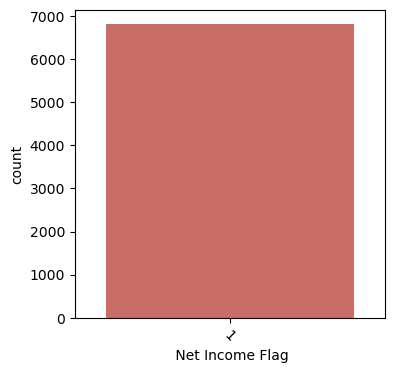

In [17]:
print("Count plot for:", 'Net Income Flag')
plt.figure(figsize=(4, 4))
sns.countplot(x=' Net Income Flag', data=df, palette='hls')
plt.xticks(rotation=-45)
plt.show()
print("\n")

Count plot for: Liability-Assets Flag


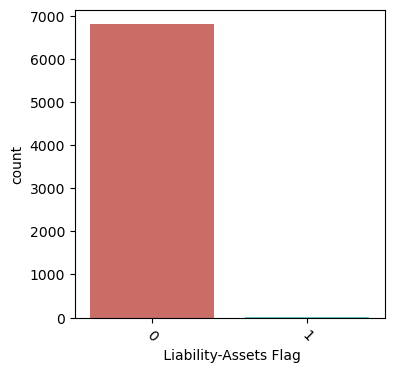

In [18]:
print("Count plot for:",'Liability-Assets Flag')
plt.figure(figsize=(4,4))
sns.countplot(x = ' Liability-Assets Flag',data=df,palette='hls')
plt.xticks(rotation=-45)
plt.show()
print("\n")

Count plot for: Bankrupt


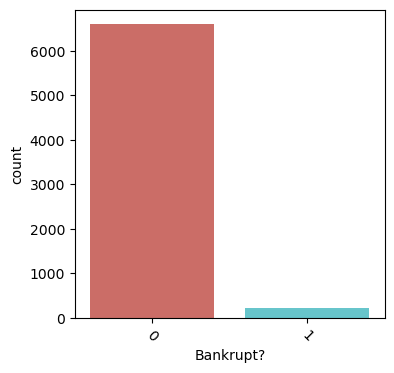

In [19]:
print("Count plot for:",'Bankrupt')
plt.figure(figsize=(4,4))
sns.countplot(x = 'Bankrupt?',data=df,palette='hls')
plt.xticks(rotation=-45)
plt.show()
print("\n")

### Data Cleaning

#### Dropping useless columns

In [20]:
df.drop([' Net Income Flag',' Liability-Assets Flag'],axis=1,inplace=True)
df.sample(10)

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share (Yuan ¥),Per Share Net profit before tax (Yuan ¥),Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability
2892,0,0.539024,0.590820,0.590128,0.615878,0.615878,0.999218,0.797653,0.809528,0.303463,0.781802,1.078888e-04,1.240000e+09,0.479478,0.000386,0.139994,0.206945,0.206945,0.206945,0.243169,0.336847,0.027119,0.127758,0.196731,0.022138,0.848075,0.689454,0.689454,0.217600,7.250000e+09,0.000488,0.264125,0.387858,0.012573,0.009091,0.631009,0.005704,0.113614,0.886386,0.005223,0.374550,0.005527,0.127738,0.195596,0.398132,0.088456,0.001010,0.006258,9.570000e+09,9.530000e+08,0.025000,0.011985,0.402218,0.016619,0.796864,0.249000,0.321707,0.100072,0.009454,0.010880,0.048438,0.362654,0.277221,0.008405,0.395429,0.735026,0.328257,0.021991,0.945433,0.002596,0.014337,1.471155e-04,1.171850e-04,0.593972,1.281304e-04,0.671585,0.472507,0.395429,0.328257,0.121870,0.656178,0.462221,0.646193,0.316574,0.023293,0.826655,0.004890,0.624984,0.615874,0.842352,0.278916,0.026907,0.565655,0.033092
111,0,0.503242,0.549171,0.559505,0.603893,0.603893,0.999002,0.797421,0.809346,0.303512,0.781613,1.324038e-04,2.390000e+09,0.463968,0.000503,0.000000,0.179723,0.179723,0.179723,0.220384,0.320577,0.027966,0.100562,0.174060,0.022135,0.848090,0.689377,0.689377,0.217598,7.030000e+09,0.000448,0.264012,0.377836,0.010437,0.006787,0.631660,0.005845,0.115337,0.884663,0.005157,0.373876,0.005366,0.100534,0.173102,0.402163,0.134933,0.000820,0.007706,9.400000e+09,1.482736e-04,0.032097,0.011959,0.393569,0

In [21]:
df.shape

(6819, 94)

### Formatting the values upto 6 decimal places

In [22]:
def format_value(value):
    if isinstance(value,(int,float)):
        return round(value,6)
    return value

In [23]:
df = df.applymap(format_value)

In [24]:
pd.set_option('display.max_columns',100)
df.iloc[::700]

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share (Yuan ¥),Per Share Net profit before tax (Yuan ¥),Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,0.780985,1.260000e-04,0.000000e+00,0.458143,0.000725,0.000000,0.147950,0.147950,0.147950,0.169141,0.311664,0.017560,0.095921,0.138736,0.022102,0.848195,0.688979,0.688979,0.217535,4.980000e+09,0.000327,0.263100,0.363725,0.002259,0.001208,0.629951,0.021266,0.207576,0.792424,0.005024,0.390284,0.006479,0.095885,0.137757,0.398036,0.086957,0.001814,0.003487,1.820000e-04,1.170000e-04,0.032903,0.034164,0.392913,0.037135,0.672775,0.166673,0.190643,0.004094,0.001997,0.000147,0.147308,0.334015,0.276920,0.001036,0.676269,0.721275,0.339077,2.559200e-02,0.903225,0.002022,0.064856,7.010000e+08,6.550000e+09,0.593831,4.580000e+08,0.671568,0.424206,0.676269,0.339077,0.126549,0.637555,0.458609,0.520382,0.312905,0.118250,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,0.016469
700,0,0.563106,0.602213,0.606510,0.614019,0.614019,0.999211,0.797628,0.809488,0.303435,0.781765,8.520000e+08,0.000000e+00,0.466244,0.000624,0.227553,0.210653,0.210653,0.210653,0.251867,0.328040,0.041926,0.144125,0.207351,0.022133,0.848077,0.689513,0.689513,0.217608,8.160000e+09,0.000486,0.264283,0.382288,0.008957,0.005238,0.631023,0.006569,0.123681,0.876319,0.005072,0.374766,0.005366,0.144129,0.206425,0.402565,0.130435,0.000856,0.007380,7.340000e+08,1.160000e-04,0.032581,0.012385,0.402275,

## Exploratory Data Analysis (EDA)

### Check for imbalance in target variable

In [25]:
print('Pie plot for Bankruptcy column')
fig=px.pie(df,names='Bankrupt?',title='Distribution of Bankruptcy')
fig.show()

Pie plot for Bankruptcy column


### Handling imbalance using random sampling

In [26]:
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
def handle_imbalanced_data(df,target):
    print("Select an option to handle the class imbalance in the target variable:")
    print("1.Random oversampling")
    print("2.Random undersampling")
    choice=input("Enter your choice(1 or 2):")
    X=df.drop(target, axis=1)
    y=df[target]
    if choice=='1':
        ros=RandomOverSampler()
        X_resampled, y_resampled = ros.fit_resample(X, y)
    elif choice=='2':
        rus=RandomUnderSampler()
        X_resampled, y_resampled = rus.fit_resample(X, y)
    else:
        print("Please enter a valid choice\n")
    df_balanced=pd.concat([X_resampled, y_resampled], axis=1)
    return df_balanced

In [27]:
df=handle_imbalanced_data(df,'Bankrupt?')
df.head()

Select an option to handle the class imbalance in the target variable:
1.Random oversampling
2.Random undersampling
Enter your choice(1 or 2):1


,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share (Yuan ¥),Per Share Net profit before tax (Yuan ¥),Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability,Bankrupt?
0,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,0.780985,1.260000e-04,0.0,0.458143,0.000725,0.0,0.147950,0.147950,0.147950,0.169141,0.311664,0.017560,0.095921,0.138736,0.022102,0.848195,0.688979,0.688979,0.217535,4.980000e+09,0.000327,0.263100,0.363725,0.002259,0.001208,0.629951,0.021266,0.207576,0.792424,0.005024,0.390284,0.006479,0.095885,0.137757,0.398036,0.086957,0.001814,0.003487,1.820000e-04,1.170000e-04,0.032903,0.034164,0.392913,0.037135,0.672775,0.166673,0.190643,0.004094,0.001997,1.470000e-04,0.147308,0.334015,0.276920,0.001036,0.676269,0.721275,0.339077,0.025592,0.903225,0.002022,0.064856,7.010000e+08,6.550000e+09,0.593831,4.580000e+08,0.671568,0.424206,0.676269,0.339077,0.126549,0.637555,0.458609,0.520382,0.312905,0.118250,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,0.016469,1
1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,0.781506,2.900000e-04,0.0,0.461867,0.000647,0.0,0.182251,0.182251,0.182251,0.208944,0.318137,0.021144,0.093722,0.169918,0.022080,0.848088,0.689693,0.689702,0.217620,6.110000e+09,0.000443,0.264516,0.376709,0.006016,0.004039,0.635172,0.012502,0.171176,0.828824,0.005059,0.376760,0.005835,0.093743,0.168962,0.397725,0.064468,0.001286,0.004917,9.360000e+09,7.190000e+08,0.025484,0.006889,0.391590,0.012335,0.751111,0.127236,0.182

### Distribution of target variable after handling imbalance

In [28]:
print('Pie plot for Bankruptcy column')
fig=px.pie(df,names='Bankrupt?',title='Distribution of bankruptcy')
fig.show()
print("\n")

Pie plot for Bankruptcy column


### Correlation Matrix

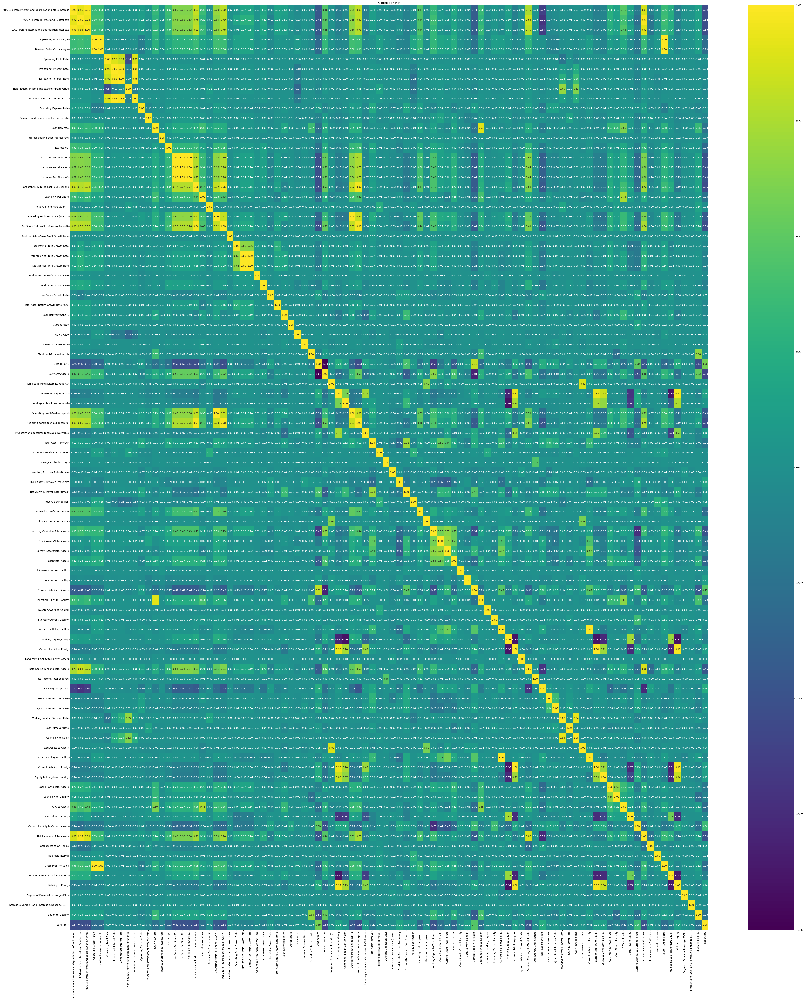

In [29]:
plt.figure(figsize=(60,70))
dataplot = sns.heatmap(df.corr(), cmap="viridis", annot=True,fmt=".2f")
plt.title("Correlation Plot")
plt.show()

### Multivariate Relationships
**Features contributing to correlation 1 are:**  Current Liabilities/Equity, Current Liabilities/Liability, Current Liability to Equity, Current Liability to Liability
**Features contributing to correlation 0.99 are:**  After-tax Net Profit Growth Rate, Continuous interest rate (after tax),
  Debt ratio %, Gross Profit to Sales, Net Value Per Share (A), Net Value Per Share (B), Net Value Per Share (C), 
  Net worth/Assets, Operating Gross Margin, Operating Profit Per Share (Yuan ¥), Operating profit/Paid-in capital, 
  Pre-tax net Interest Rate, Realized Sales Gross Margin, Regular Net Profit Growth Rate

### Histograms of numerical data

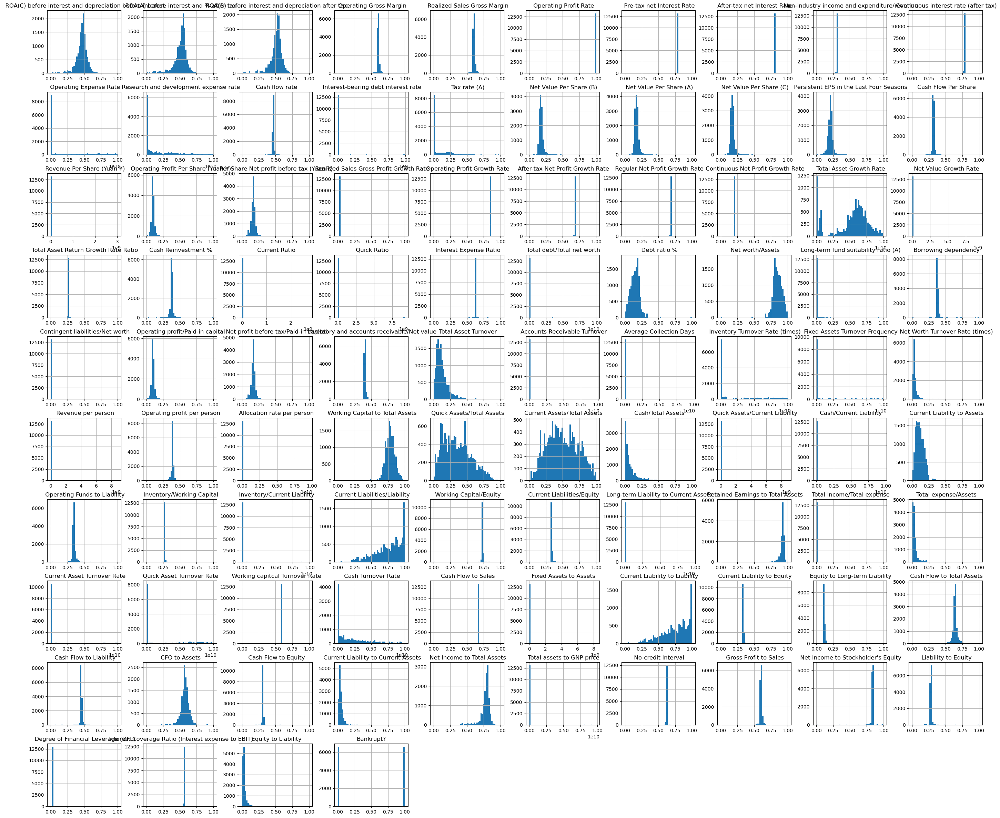

In [30]:
df.hist(figsize = (35,30), bins = 50)
plt.show()

### Boxplots for given important features w.r.t Bankrupt

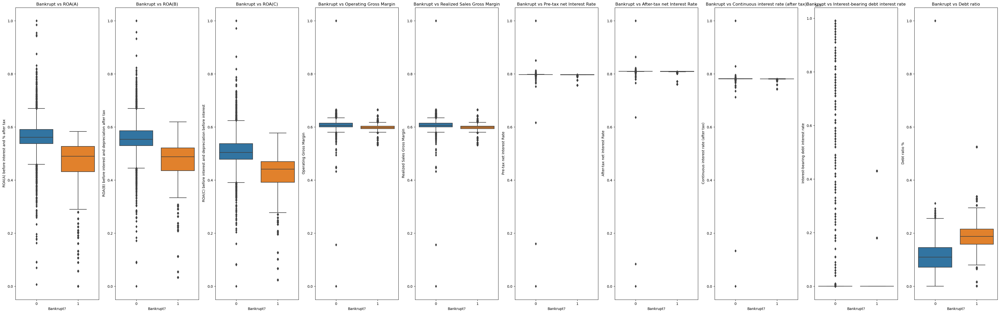

In [31]:
f, axes = plt.subplots(ncols=10, figsize=(50,15))

sns.boxplot(x='Bankrupt?', y=" ROA(A) before interest and % after tax", data=df, ax=axes[0])
axes[0].set_title('Bankrupt vs ROA(A)')

sns.boxplot(x='Bankrupt?', y=" ROA(B) before interest and depreciation after tax", data=df, ax=axes[1])
axes[1].set_title('Bankrupt vs ROA(B)')

sns.boxplot(x='Bankrupt?', y=" ROA(C) before interest and depreciation before interest", data=df, ax=axes[2])
axes[2].set_title('Bankrupt vs ROA(C)')

sns.boxplot(x='Bankrupt?', y=" Operating Gross Margin", data=df, ax=axes[3]) 
axes[3].set_title('Bankrupt vs Operating Gross Margin')


sns.boxplot(x='Bankrupt?', y=" Realized Sales Gross Margin", data=df, ax=axes[4])
axes[4].set_title('Bankrupt vs Realized Sales Gross Margin')


sns.boxplot(x='Bankrupt?', y=" Pre-tax net Interest Rate", data=df, ax=axes[5])  
axes[5].set_title('Bankrupt vs Pre-tax net Interest Rate') 

sns.boxplot(x='Bankrupt?', y=" After-tax net Interest Rate", data=df, ax=axes[6])  
axes[6].set_title('Bankrupt vs After-tax net Interest Rate') 

sns.boxplot(x='Bankrupt?', y=" Continuous interest rate (after tax)", data=df, ax=axes[7])  
axes[7].set_title('Bankrupt vs Continuous interest rate (after tax)') 

sns.boxplot(x='Bankrupt?', y=" Interest-bearing debt interest rate", data=df, ax=axes[8])  
axes[8].set_title('Bankrupt vs Interest-bearing debt interest rate') 

sns.boxplot(x='Bankrupt?', y=" Debt ratio %", data=df, ax=axes[9])  
axes[9].set_title('Bankrupt vs Debt ratio') 

plt.show()

### Analyzing top 5 positively and negatively correlated features w.r.t Bankrupt

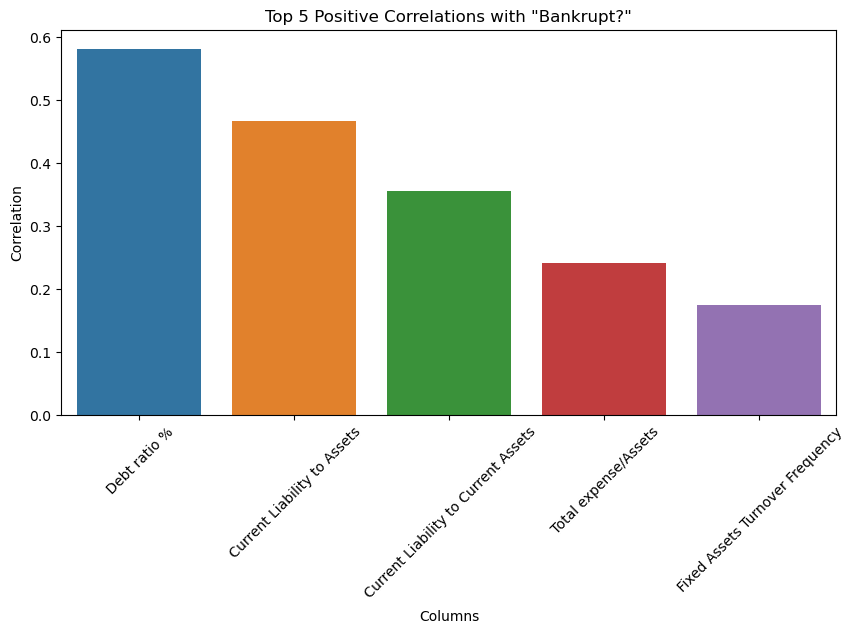

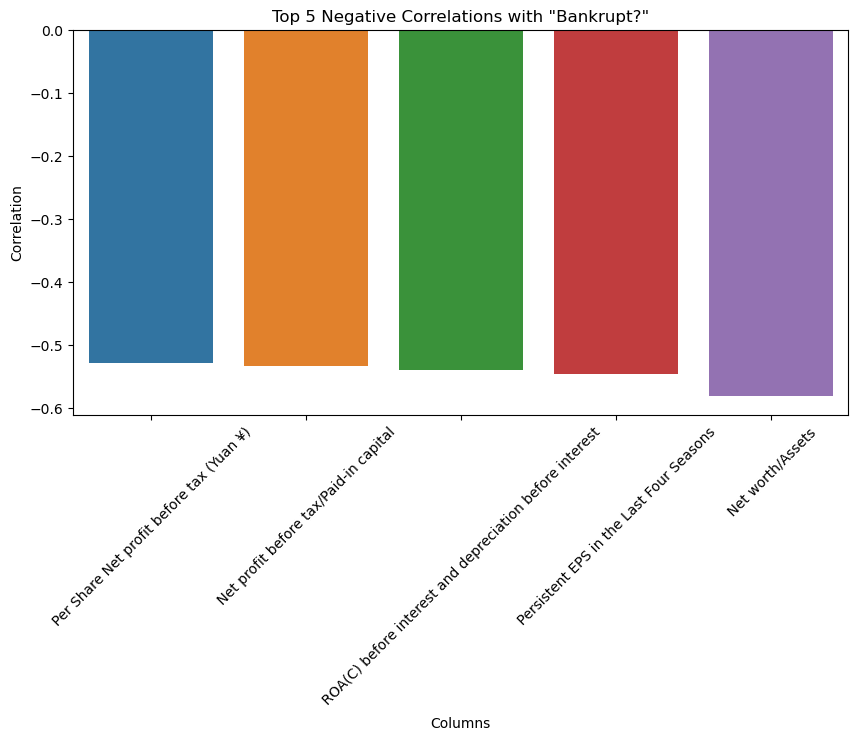

In [32]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame and "Bankrupt?" is the target column
numeric_columns = df.dtypes[df.dtypes == 'float64'].index

# Calculate correlations with the "Bankrupt?" column
correlations = df[numeric_columns].corrwith(df["Bankrupt?"]).sort_values(ascending=False)

# Get the top 5 positive and negative correlation columns
positive_corr_columns = correlations[:5].index.tolist()
negative_corr_columns = correlations[-5:].index.tolist()

# Select the columns of interest including the target column
positive_corr_df = df[positive_corr_columns + ["Bankrupt?"]]
negative_corr_df = df[negative_corr_columns + ["Bankrupt?"]]

# Plot the positive correlations
plt.figure(figsize=(10, 5))
sns.barplot(x=positive_corr_df.columns[:-1], y=positive_corr_df.corr()["Bankrupt?"][:-1])
plt.title('Top 5 Positive Correlations with "Bankrupt?"')
plt.xlabel('Columns')
plt.ylabel('Correlation')
plt.xticks(rotation=45)
plt.show()

# Plot the negative correlations
plt.figure(figsize=(10, 5))
sns.barplot(x=negative_corr_df.columns[:-1], y=negative_corr_df.corr()["Bankrupt?"][:-1])
plt.title('Top 5 Negative Correlations with "Bankrupt?"')
plt.xlabel('Columns')
plt.ylabel('Correlation')
plt.xticks(rotation=45)
plt.show()


### Splitting the features

In [33]:
X=df.drop(['Bankrupt?'],axis=1)
y=df['Bankrupt?']

In [34]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size = 0.2, random_state = 42)

### Training Random Forest Classifier

In [35]:
model=RandomForestClassifier()

model.fit(X_train, y_train)
y_pred = model.predict(X_test)
    
print("Confusin Matrix:\n")
print(confusion_matrix(y_test,y_pred))
print()
print("Classification Report:\n")
print(classification_report(y_test,y_pred))

Confusin Matrix:

[[1323   11]
 [   0 1306]]

Classification Report:

              precision    recall  f1-score   support

           0       1.00      0.99      1.00      1334
           1       0.99      1.00      1.00      1306

    accuracy                           1.00      2640
   macro avg       1.00      1.00      1.00      2640
weighted avg       1.00      1.00      1.00      2640



### Feature importance analysis

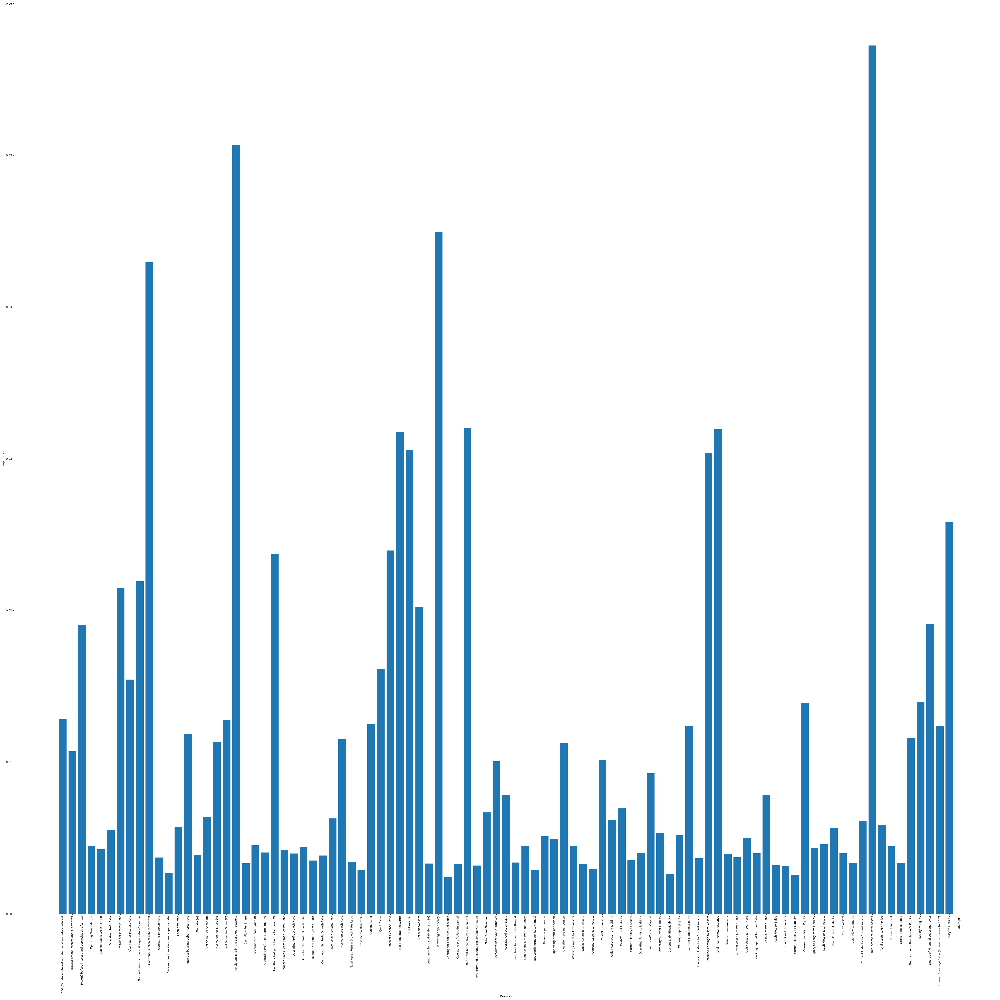

In [36]:
feature_names = df.columns  

# Create a bar plot with feature names as x-axis labels
plt.figure(figsize=(50,50))  
plt.bar(range(len(model.feature_importances_)), model.feature_importances_)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.xticks(range(len(feature_names)), feature_names, rotation=90)  # Rotate x-axis labels for readability
plt.tight_layout()
plt.show()


### Feature Engineering ( based on feature importance )

In [37]:
feature_importances = model.feature_importances_
sorted_feature_indices=feature_importances.argsort()[::-1]
k=19
selected_columns=df.columns[sorted_feature_indices[:k]]
selected_df=df[selected_columns]

### Inferences
**Based on feature importance, following are some of the most important columns:**

* Persistent EPS in the Last Four Seasons,
* Continuous interest rate (after tax),
* Retained Earnings to Total Assets, 
* Equity to Liability,
* Borrowing dependency,
* Per Share Net profit before tax (Yuan ¥),
* Net Income to Total Assets,
* Total debt/Total net worth,
* Interest Expense Ratio,
* After-tax net Interest Rate,
* Total income/Total expense, 
* Net worth/Assets,
* ROA(B) before interest and depreciation after tax,
* Net profit before tax/Paid-in capital,
* ROA(C) before interest and depreciation before interest,
* Debt ratio %,
* Net Income to Stockholder's Equity, 
* Quick Ratio,
* Pre-tax net Interest Rate
        

In [38]:
selected_df.columns

Index([' Net Income to Total Assets',
       ' Persistent EPS in the Last Four Seasons', ' Borrowing dependency',
       ' Continuous interest rate (after tax)',
       ' Net profit before tax/Paid-in capital', ' Total income/Total expense',
       ' Total debt/Total net worth', ' Debt ratio %',
       ' Retained Earnings to Total Assets', ' Equity to Liability',
       ' Interest Expense Ratio', ' Per Share Net profit before tax (Yuan ¥)',
       ' Non-industry income and expenditure/revenue',
       ' Pre-tax net Interest Rate', ' Net worth/Assets',
       ' Degree of Financial Leverage (DFL)',
       ' ROA(B) before interest and depreciation after tax', ' Quick Ratio',
       ' After-tax net Interest Rate'],
      dtype='object')

In [39]:
selected_df['Bankrupt']=df['Bankrupt?']

In [40]:
selected_df.shape

(13198, 20)

In [41]:
selected_df.head()

,Net Income to Total Assets,Persistent EPS in the Last Four Seasons,Borrowing dependency,Continuous interest rate (after tax),Net profit before tax/Paid-in capital,Total income/Total expense,Total debt/Total net worth,Debt ratio %,Retained Earnings to Total Assets,Equity to Liability,Interest Expense Ratio,Per Share Net profit before tax (Yuan ¥),Non-industry income and expenditure/revenue,Pre-tax net Interest Rate,Net worth/Assets,Degree of Financial Leverage (DFL),ROA(B) before interest and depreciation after tax,Quick Ratio,After-tax net Interest Rate,Bankrupt
0,0.716845,0.169141,0.390284,0.780985,0.137757,0.002022,0.021266,0.207576,0.903225,0.016469,0.629951,0.138736,0.302646,0.796887,0.792424,0.026601,0.405750,0.001208,0.808809,1
1,0.795297,0.208944,0.376760,0.781506,0.168962,0.002226,0.012502,0.171176,0.931065,0.020794,0.635172,0.169918,0.303556,0.797380,0.828824,0.264577,0.516730,0.004039,0.809301,1
2,0.774670,0.180581,0.379093,0.780284,0.148036,0.002060,0.021248,0.207516,0.909903,0.016474,0.629631,0.142803,0.302035,0.796403,0.792484,0.026555,0.472295,0.005348,0.808388,1
3,0.739555,0.193722,0.379743,0.781241,0.147561,0.001831,0.009572,0.151465,0.906902,0.023982,0.630228,0.148603,0.303350,0.796967,0.848535,0.026697,0.457733,0.002896,0.808966,1
4,0.795016,0.212537,0.375025,0.781550,0.167461,0.002224,0.005150,0.106509,0.913850,0.035490,0.636055,0.168412,0.303475,0.797366,0.893491,0.024752,0.522298,0.003727,0.809304,1


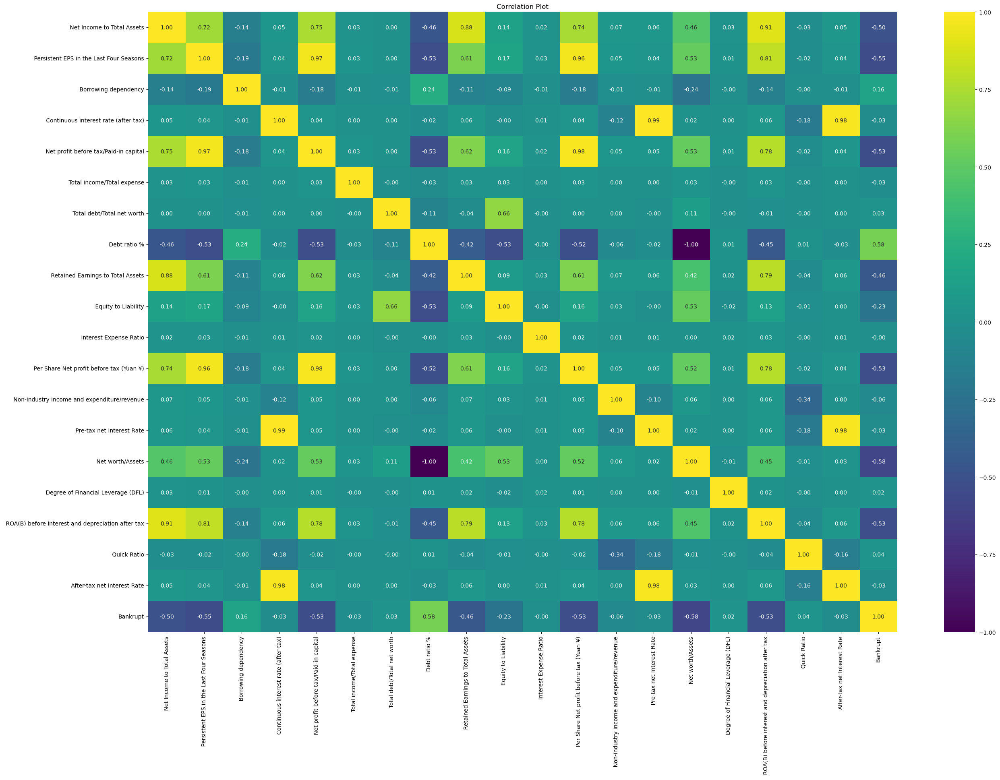

In [42]:
plt.figure(figsize=(30,20))
dataplot = sns.heatmap(selected_df.corr(), cmap="viridis", annot=True,fmt=".2f")
plt.title("Correlation Plot")
plt.show()

### Anomaly Detection (using IQR)

In [43]:
Q1 = selected_df.quantile(0.25)
Q3 = selected_df.quantile(0.75)
IQR = Q3 - Q1

# Define a threshold to identify outliers (e.g., 1.5 times the IQR)
threshold = 1.5

# Identify and remove outliers
selected_df = selected_df[~((selected_df < (Q1 - threshold * IQR)) | (selected_df > (Q3 + threshold * IQR)).any(axis=1))]

In [44]:
selected_df.shape

(13198, 20)

In [45]:
selected_df.isnull().sum()

 Net Income to Total Assets                            887
 Persistent EPS in the Last Four Seasons               561
 Borrowing dependency                                  154
 Continuous interest rate (after tax)                 1286
 Net profit before tax/Paid-in capital                 680
 Total income/Total expense                             42
 Total debt/Total net worth                              0
 Debt ratio %                                            0
 Retained Earnings to Total Assets                     752
 Equity to Liability                                     0
 Interest Expense Ratio                               1237
 Per Share Net profit before tax (Yuan ¥)              728
 Non-industry income and expenditure/revenue          1453
 Pre-tax net Interest Rate                            1285
 Net worth/Assets                                      133
 Degree of Financial Leverage (DFL)                   1001
 ROA(B) before interest and depreciation after tax     6

In [46]:
selected_df = selected_df.dropna(axis=0)

In [47]:
selected_df.shape

(9519, 20)

## Model Training

In [48]:
X=selected_df.drop(['Bankrupt'],axis=1)
y=selected_df['Bankrupt']

In [49]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size = 0.2, random_state = 42)

In [50]:
models = [
    LogisticRegression(),
    RandomForestClassifier(),
    DecisionTreeClassifier(),
    GradientBoostingClassifier(),
    AdaBoostClassifier()
]

In [51]:
for model in models:
    print(f'Model: {model.__class__.__name__}')
    
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    print("Confusin Matrix:\n")
    print(confusion_matrix(y_test,y_pred))
    print()
    print("Classification Report:\n")
    print(classification_report(y_test,y_pred))
    print("------------------------------------------")

Model: LogisticRegression
Confusin Matrix:

[[1209   22]
 [ 570  103]]

Classification Report:

              precision    recall  f1-score   support

           0       0.68      0.98      0.80      1231
           1       0.82      0.15      0.26       673

    accuracy                           0.69      1904
   macro avg       0.75      0.57      0.53      1904
weighted avg       0.73      0.69      0.61      1904

------------------------------------------
Model: RandomForestClassifier
Confusin Matrix:

[[1222    9]
 [   0  673]]

Classification Report:

              precision    recall  f1-score   support

           0       1.00      0.99      1.00      1231
           1       0.99      1.00      0.99       673

    accuracy                           1.00      1904
   macro avg       0.99      1.00      0.99      1904
weighted avg       1.00      1.00      1.00      1904

------------------------------------------
Model: DecisionTreeClassifier
Confusin Matrix:

[[1206   25]
 [ 

### CONCLUSION

* Logistic Regression gave the least accuracy (0.65)
* Both Random Forest Classifier and Decision Tree Classifier overfitted the data leading to accuracies near to 1
* Both Gradient Boosting Classifier and Ada Boost Classifier worked well on the data

##### Overall, the Gradient Boosting Classifier seems to work best

### Saving the gradient boost bodel

In [52]:
import pickle
with open("gradient.pkl", 'wb') as model_file:
  pickle.dump(models[3], model_file)

## Using k-means clustering

### Feature selection based on correlation matrix

In [55]:
df1=pd.read_csv("C:/Users/niran/Desktop/Bankruptcy/Datathon dataset.csv")

In [56]:
# Set the threshold for correlation
threshold = 0.7
correlation_matrix=df1.corr()

# Initialize an empty list to store feature pairs with correlations >= 0.5
high_correlation_features = []

# Iterate through the correlation matrix and find feature pairs with correlations >= 0.5
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) >= threshold:
            # Add the pair of features to the list
            high_correlation_features.append((correlation_matrix.columns[i], correlation_matrix.columns[j]))

# Extract unique feature names from the high_correlation_features list
unique_feature_names = set()
for feature_pair in high_correlation_features:
    unique_feature_names.add(feature_pair[0])
    unique_feature_names.add(feature_pair[1])

# Convert the set to a sorted list for easier inspection
unique_feature_names = sorted(list(unique_feature_names))

# Print the list of unique feature names
print("Unique Feature Names with Correlations >= 0.5:")
for feature_name in unique_feature_names:
    print(feature_name)

Unique Feature Names with Correlations >= 0.5:
 After-tax Net Profit Growth Rate
 After-tax net Interest Rate
 Borrowing dependency
 CFO to Assets
 Cash Flow Per Share
 Cash Flow to Liability
 Cash Flow to Sales
 Cash Flow to Total Assets
 Cash Reinvestment %
 Cash flow rate
 Contingent liabilities/Net worth
 Continuous interest rate (after tax)
 Current Assets/Total Assets
 Current Liabilities/Equity
 Current Liabilities/Liability
 Current Liability to Assets
 Current Liability to Equity
 Current Liability to Liability
 Debt ratio %
 Equity to Long-term Liability
 Gross Profit to Sales
 Inventory and accounts receivable/Net value
 Liability to Equity
 Net Income to Stockholder's Equity
 Net Income to Total Assets
 Net Value Per Share (A)
 Net Value Per Share (B)
 Net Value Per Share (C)
 Net Worth Turnover Rate (times)
 Net profit before tax/Paid-in capital
 Net worth/Assets
 Non-industry income and expenditure/revenue
 Operating Funds to Liability
 Operating Gross Margin
 Operating P

In [57]:
selected_df = df1[unique_feature_names]

### Data exploration

In [58]:
selected_df.shape

(6819, 51)

In [59]:
selected_df.isnull().sum()

 After-tax Net Profit Growth Rate                           0
 After-tax net Interest Rate                                0
 Borrowing dependency                                       0
 CFO to Assets                                              0
 Cash Flow Per Share                                        0
 Cash Flow to Liability                                     0
 Cash Flow to Sales                                         0
 Cash Flow to Total Assets                                  0
 Cash Reinvestment %                                        0
 Cash flow rate                                             0
 Contingent liabilities/Net worth                           0
 Continuous interest rate (after tax)                       0
 Current Assets/Total Assets                                0
 Current Liabilities/Equity                                 0
 Current Liabilities/Liability                              0
 Current Liability to Assets                                0
 Current

In [60]:
selected_df.shape

(6819, 51)

### Generating 2 clusters

In [61]:
n_clusters = 2  # Adjust the number of clusters as needed

# Create a K-Means clustering model
kmeans = KMeans(n_clusters=n_clusters, random_state=42)

# Fit the model to the data
kmeans.fit(selected_df)

KMeans(n_clusters=2, random_state=42)

In [62]:
# Create a DataFrame with cluster labels
cluster_df = pd.DataFrame(data={'Bankrupt_from_cluster': kmeans.labels_})

In [63]:
cluster_df.isnull().sum()

Bankrupt_from_cluster    0
dtype: int64

In [64]:
selected_df['Bankrupt_from_cluster'] = cluster_df['Bankrupt_from_cluster']

In [65]:
selected_df.shape

(6819, 52)

In [66]:
selected_df["Bankrupt_from_cluster"].value_counts()

0    3780
1    3039
Name: Bankrupt_from_cluster, dtype: int64

In [67]:
selected_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 52 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0    After-tax Net Profit Growth Rate                         6819 non-null   float64
 1    After-tax net Interest Rate                              6819 non-null   float64
 2    Borrowing dependency                                     6819 non-null   float64
 3    CFO to Assets                                            6819 non-null   float64
 4    Cash Flow Per Share                                      6819 non-null   float64
 5    Cash Flow to Liability                                   6819 non-null   float64
 6    Cash Flow to Sales                                       6819 non-null   float64
 7    Cash Flow to Total Assets                                6819 non-null   float64
 8    Cash Reinvestment

In [68]:
selected_df.sample(5)

,After-tax Net Profit Growth Rate,After-tax net Interest Rate,Borrowing dependency,CFO to Assets,Cash Flow Per Share,Cash Flow to Liability,Cash Flow to Sales,Cash Flow to Total Assets,Cash Reinvestment %,Cash flow rate,Contingent liabilities/Net worth,Continuous interest rate (after tax),Current Assets/Total Assets,Current Liabilities/Equity,Current Liabilities/Liability,Current Liability to Assets,Current Liability to Equity,Current Liability to Liability,Debt ratio %,Equity to Long-term Liability,Gross Profit to Sales,Inventory and accounts receivable/Net value,Liability to Equity,Net Income to Stockholder's Equity,Net Income to Total Assets,Net Value Per Share (A),Net Value Per Share (B),Net Value Per Share (C),Net Worth Turnover Rate (times),Net profit before tax/Paid-in capital,Net worth/Assets,Non-industry income and expenditure/revenue,Operating Funds to Liability,Operating Gross Margin,Operating Profit Per Share (Yuan ¥),Operating Profit Rate,Operating profit/Paid-in capital,Per Share Net profit before tax (Yuan ¥),Persistent EPS in the Last Four Seasons,Pre-tax net Interest Rate,Quick Assets/Total Assets,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,ROA(C) before interest and depreciation before interest,Realized Sales Gross Margin,Regular Net Profit Growth Rate,Retained Earnings to Total Assets,Total Asset Turnover,Working Capital to Total Assets,Working Capital/Equity,Working capitcal Turnover Rate,Bankrupt_from_cluster
3884,0.689367,0.809448,0.369970,0.601569,0.327509,0.440144,0.671551,0.605826,0.375247,0.473129,0.005366,0.781744,0.368060,0.327235,0.650807,0.033703,0.327235,0.650807,0.046498,0.111523,0.607675,0.396045,0.276020,0.841943,0.830428,0.246049,0.246049,0.246049,0.030323,0.206018,0.953502,0.303587,0.363792,0.607677,0.128410,0.999099,0.128210,0.209385,0.255838,0.797580,0.337401,0.595235,0.602120,0.565690,0.607677,0.689367,0.946832,0.161919,0.822704,0.735466,0.593965,1
3038,0.688923,0.809249,0.378830,0.560436,0.316616,0.460303,0.671579,0.649679,0.375172,0.460928,0.005366,0.781502,0.591592,0.332088,0.547224,0.097207,0.332088,0.547224,0.167790,0.124158,0.633252,0.408778,0.283434,0.839191,0.787983,0.176099,0.176099,0.176099,0.031290,0.163034,0.832210,0.303499,0.339884,0.633254,0.090221,0.998915,0.090185,0.163441,0.207904,0.797310,0.443740,0.517444,0.511162,0.457466,0.633254,0.688923,0.929257,0.095952,0.827282,0.739214,0.594011,1
3653,0.693745,0.809441,0.369637,0.527352,0.312230,0.424997,0.671552,0.596889,0.368196,0.449948,0.005366,0.781709,0.915701,0.327203,0.976919,0.034762,0.327203,0.976919,0.030837,0.110933,0.611374,0.400778,0.275554,0.842253,0.838547,0.197210,0.197210,0.197210,0.034355,0.188568,0.969163,0.303506,0.307096,0.611374,0.117987,0.999090,0.118008,0.189576,0.238726,0.797524,0.747058,0.605375,0.590503,0.533564,0.611374,0.693745,0.947849,0.199400,0.971754,0.742160,0.594034,0
867,0.689374,0.809392,0.376335,0.570871,0.318738,0.456673,0.671561,0.628372,0.373775,0.462033,0.005366,0.781658,0.438336,0.331519,0.697215,0.105016,0.331519,0.697215,0.142455,0.117877,0.611628,0.403448,0.280931,0.841432,0.811532,0.181450,0.181450,0.181450,0.032581,0.180318,0.857545,0.303557,0.342014,0.611633,0.105366,0.999036,0.105387,0.181291,0.226624,0.797489,0.299764,0.560946,0.559934,0.508507,0.611633,0.689374,0.939378,0.116942,0.778342,0.734130,0.593941,1
5342,0.689429,0.809480,0.375614,0.596780,0.324114,0.465968,0.671600,0.679151,0.381077,0.466227,0.005366,0.781755,0.600570,0.329715,0.488295,0.071665,0.329715,0.488295,0.137618,0.122656,0.610918,0.403072,0.280541,0.842713,0.826822,0.186001,0.186001,0.186128,0.032742,0.193319,0.862382,0.303488,0.347864,0.610920,0.124013,0.999168,0.124025,0.194698,0.239766,0.797607,0.466177,0.592237,0.585792,0.539512,0.610920,0.689429,0.942355,0.121439,0.852525,0.739787,0.594013,1


### Model Training

In [69]:
X=selected_df.drop(['Bankrupt_from_cluster'],axis=1)
y=selected_df['Bankrupt_from_cluster']

X_train,X_test,y_train,y_test=train_test_split(X, y, test_size=0.2, random_state=42)

In [70]:
models = [
    LogisticRegression(),
    RandomForestClassifier(),
    DecisionTreeClassifier(),
    GradientBoostingClassifier(),
    AdaBoostClassifier()
]

In [71]:
for model in models:
    print(f'Model: {model.__class__.__name__}')
    
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    print("Confusin Matrix:\n")
    print(confusion_matrix(y_test,y_pred))
    print()
    print("Classification Report:\n")
    print(classification_report(y_test,y_pred))
    print("------------------------------------------")

Model: LogisticRegression
Confusin Matrix:

[[742   3]
 [  4 615]]

Classification Report:

              precision    recall  f1-score   support

           0       0.99      1.00      1.00       745
           1       1.00      0.99      0.99       619

    accuracy                           0.99      1364
   macro avg       0.99      0.99      0.99      1364
weighted avg       0.99      0.99      0.99      1364

------------------------------------------
Model: RandomForestClassifier
Confusin Matrix:

[[733  12]
 [ 19 600]]

Classification Report:

              precision    recall  f1-score   support

           0       0.97      0.98      0.98       745
           1       0.98      0.97      0.97       619

    accuracy                           0.98      1364
   macro avg       0.98      0.98      0.98      1364
weighted avg       0.98      0.98      0.98      1364

------------------------------------------
Model: DecisionTreeClassifier
Confusin Matrix:

[[730  15]
 [ 24 595]]



#### CONCLUSION

* Logistic Regression overfitted the data
* Of the remaining models, Decision Tree Classifier seems to work best

### Saving the decision tree model

In [72]:
import pickle
with open('DecisionTree.pkl', 'wb') as model_file:
    pickle.dump(models[2], model_file)

### Model Comparision

**Comparing accuracies of models**

In [73]:
accuracies=[]
for model in models:
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    accuracies.append(accuracy)
    
model_names = ['Logistic regression',  'Random Forest Classifier', 'Decision Tree Classifier', 'Gradient Boost Classifier', 'Ada Boost Classifier']
fig = go.Figure(data=go.Bar(x=model_names, y=accuracies))
fig.update_layout(title='Model Accuracies',
                  xaxis_title='Model',
                  yaxis_title='Accuracy',
                  yaxis_tickformat='.2%', 
                  yaxis_range=[0, 1],  
                  xaxis_tickangle=0)
fig.show()

**Comparing F1-scores of models**

In [74]:
from sklearn.metrics import f1_score

f1_scores = []  

for model in models:
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    f1 = f1_score(y_test, y_pred)  
    f1_scores.append(f1) 

model_names = ['Logistic regression',  'Random Forest Classifier', 'Decision Tree Classifier', 'Gradient Boost Classifier', 'Ada Boost Classifier']

# Create a bar chart for F1 scores
fig = go.Figure(data=go.Bar(x=model_names, y=f1_scores))

# Update the layout of the figure
fig.update_layout(
    title='Model F1 Scores',
    xaxis_title='Model',
    yaxis_title='F1 Score',
    yaxis_tickformat='.2%',
    yaxis_range=[0, 1],
    xaxis_tickangle=0
)

# Show the figure
fig.show()
